# <i>COM-418 - Computers and Music</i> <br /> <br />  <b>Deep learning in music production</b> 

<div align="right"><a href="https://people.epfl.ch/lucie.perrotta">Lucie Perrotta</a> and <a href="https://people.epfl.ch/paolo.prandoni">Paolo Prandoni</a>, <a href="https://www.epfl.ch/labs/lcav/">LCAV, EPFL</a></div>

In [1]:
import torch
import torchaudio
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
from IPython.display import IFrame
from openunmix import predict

import import_ipynb
from Helpers import *

import warnings
warnings.filterwarnings('ignore') # Ignore warnings

import matplotlib
figsize=(10,5)
matplotlib.rcParams.update({'font.size': 16})

importing Jupyter notebook from Helpers.ipynb


In [1]:
fs=44100

importing Jupyter notebook from Helpers.ipynb


In this notebook, we give a glance of a couple applications of deep learning in music production. These methods generally make use of large training datasets, and are hence already pre-compiled in libraries for being ready to use. We will hence mostly test out existing libraries, rather than implementing one from scratch.

While deep learning has been extensively used in music research for generating music or classifying genres, we here focus on its application to music **production**.

## 1. Instrument separation

One of the first application that deep learning has found in audio production is source separation. This is the process of automatically isolating different instruments from a master track where everyrthing is merged together. This is mostly used for remixing and remastering old records that were produced in a time where not enough tracks were available in the studio during recording. Most (high-budget) records produced in the 1960s used 4 track-recorders, which allowed to simultaneously record 4 tracks, and to merge them together in one. A famous 4-track tape recorder is the Ampex 440.

<img src="https://cdn1.soniccircus.com/uploads/ampex_440_vintage_tape_machine_f-2.jpg" alt="Drawing" style="width: 55%;"/>

4 tracks were a comfortable quantity for simple records where only drums, a bass, a guitar, and a lead voice were needed. However, as the music industry evolved quickly, producers started layering up more tracks to make the sound more complete. This concept of stacking a lot of tracks was called [the Wall of sound](https://en.wikipedia.org/wiki/Wall_of_Sound) and is still a classic technique of recording today. Producers hence starting merging tracks together in different iterations, allowing to increase the total virtual number of tracks. Drums and bass were generally merged together, all layers of voice together, all guitars, etc. While the resulting sound was awesome, it had the drawback that the original individual tracks were lost.

Later remasters hence had to deal with the limited number of "sub-mixed" tracks (generally 4 in total), allowing only a very limited power of audio treatment. Instrument separation is hence one of the first efficient method for re-separating all instruments and mixing them independently, and has been used in recent years to provide higher quality remasters of old records.

[See this page for more details on the history of multitrack recording.](https://en.wikipedia.org/wiki/History_of_multitrack_recording)

In this section, we use **OpenUnmix**, a Python library using DNNs to isolate 4 tracks (vocals, drums, bass, and the rest) out of a master track. See https://www.theoj.org/joss-papers/joss.01667/10.21105.joss.01667.pdf

Let's first import a section of a song. This song is called **Uncontrollable urge** by **DEVO** and was released in 1978.

<img src="https://e.snmc.io/i/600/s/32a14088d9c98719ccecbf9dacc285f5/2377715/devo-q-are-we-not-men-a-we-are-devo-Cover-Art.jpg" alt="Drawing" style="width: 25%;"/>

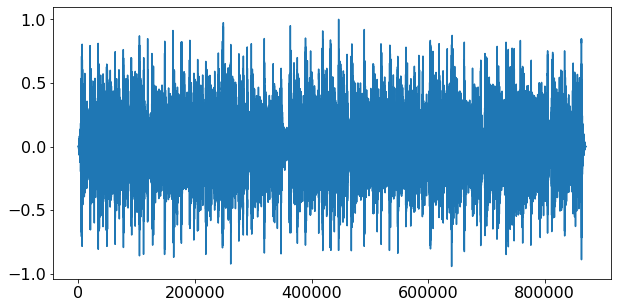

In [3]:
urge = open_audio('samples/urge.wav')
Audio('samples/urge.wav', autoplay=False)

Using OpenUnmix, we now generate 4 tracks with the instruments isolated!

PS. If you have an error about something like **Scraping: SSL: CERTIFICATE_VERIFY_FAILED**, you may want to try to go to your Python app folder

- for mac users: Macintosh HD > Applications > Python3.6 and double click on "Install Certificates.command" file.
- for windows users: run the code `import ssl; ssl._create_default_https_context = ssl._create_unverified_context` in jupyter

In [4]:
estimates = predict.separate(
    torch.as_tensor(urge).float(),
    rate=fs,
    niter=3,
    device=device
)   

for target, estimate in estimates.items():
    print(target)
    audio = estimate.detach().cpu().numpy()[0]
    display(Audio(audio, rate=fs))

vocals


drums


bass


other
